<a href="https://colab.research.google.com/github/gpicciuca/ai_engineering_master/blob/main/module10_gen_ai/Project_Data_Augmentation_for_powerplants_security.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Augmentation for powerplant safety
Module: Generative AI @ Profession.AI <br>
Course: Master in AI Engineering <br>
Student: Giuseppe Picciuca <br>

<br>

Task:
- Augment an existing image dataset to generate new samples in order to improve the accuracy and overall performance of an image classification model

Steps:
- Dataset acquirement: Use OxfordIIITPet as a base for the dataset
- Image Captioning and data generation: Use an Image-to-Text model to generate Image Captions for the existing dataset. Then a Text-To-Text model to generate variations of these captions. Lastly, a Text-To-Image model to generate new image samples from the new captions.
- Train a Model: Train an Image classification model on the extended/augmented dataset and evaluate/compare its performance on the original dataset as well as the augmented one.
- Document train/eval metrics

We'll start by installing required libraries:

In [ ]:
!pip install diffusers

In [ ]:
!pip uninstall diffusers
!pip install --upgrade transformers peft accelerate bitsandbytes diffusers["torch"] huggingface_hub[hf_xet]

Next, some useful imports that are needed throughout the notebook:

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as T
from torchvision.transforms import ToTensor
from torchvision.datasets import ImageFolder
from torchvision.datasets.oxford_iiit_pet import OxfordIIITPet
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
import torchvision.models as models

import albumentations as A
from albumentations.pytorch import ToTensorV2

from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler

import os
import json
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from collections import defaultdict
from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    confusion_matrix,
)
from sklearn.model_selection import train_test_split

from transformers import pipeline, AutoModelForCausalLM, AutoTokenizer

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


Log into HuggingFace. We'll need this to access some pretrained models:

In [ ]:
from huggingface_hub import login as hf_login
from google.colab import userdata
hf_login(userdata.get("HF_TOKEN"))

Also mount Google Drive so we can persist our generated/downloaded data:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
DATA_PATH = "./content/drive/MyDrive/GenAIDataAugmentation"

if not os.path.exists(DATA_PATH):
    os.makedirs(DATA_PATH)

# Helper methods
Collection of methods that can be reused later on.

In [ ]:
image_mean = np.array([0.5, 0.5, 0.5])
image_std = np.array([0.5, 0.5, 0.5])

# Transforms a Tensor back into an RGB image buffer
def image_from_tensor(img_tensor, use_normalization = True):
    img = img_tensor.numpy().transpose((1, 2, 0))
    if use_normalization:
        img = image_std * img + image_mean
    img = np.clip(img, 0, 1)
    return img

# Plots a set of images from the image_folder in a user-defined grid
def grid_plot(image_folder: ImageFolder, start_index=0, rows=5, cols=5, size=(12, 12), use_normalization = True, classes = None):
    plt.figure(figsize=size)
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        img, label = image_folder[start_index + i]
        img = to_pil_image(image_from_tensor(img, use_normalization = use_normalization)) if isinstance(img, torch.Tensor) else img
        plt.imshow(img)
        plt.title(image_folder.classes[label] if classes is None else classes[label])
    plt.tight_layout()
    plt.show()

def grid_plot_dataloader(loader: DataLoader, targets, predictions, classes, show_false_only = False, start_index=0, rows=5, cols=5, size=(12, 12)):
    plt.figure(figsize=size)
    i = 0

    for idx, (img, label) in enumerate(loader, 0):
        plt.subplot(rows, cols, i + 1)
        predicted_label = predictions[idx]
        actual_label = targets[idx]

        # DataLoader does not support indexing, so we hack our way around it
        if idx < start_index:
            continue

        if show_false_only and actual_label == predicted_label:
            continue

        img = to_pil_image(image_from_tensor(img[0])) if isinstance(img, torch.Tensor) else img
        plt.imshow(img)
        plt.title(
            "%s" % classes[predicted_label],
            color="red" if actual_label != predicted_label else "green",
            fontsize=10,
        )
        plt.xlabel(classes[actual_label])

        i += 1
        if i >= rows * cols:
            break

    plt.tight_layout()
    plt.show()

# Image Captioning

Now we'll download the OXfordIIIPet dataset:

In [ ]:
ORIG_DATASET_PATH = f"{DATA_PATH}/oxford_iiipet_data"
dataset = OxfordIIITPet(root=ORIG_DATASET_PATH, download=True, split="trainval")
test_dataset = OxfordIIITPet(root=ORIG_DATASET_PATH, download=True, split="test")
print("Train-Val Size: ", len(dataset))
print("Test Size: ", len(test_dataset))

Train-Val Size:  3680
Test Size:  3669


A quick look of what's inside:

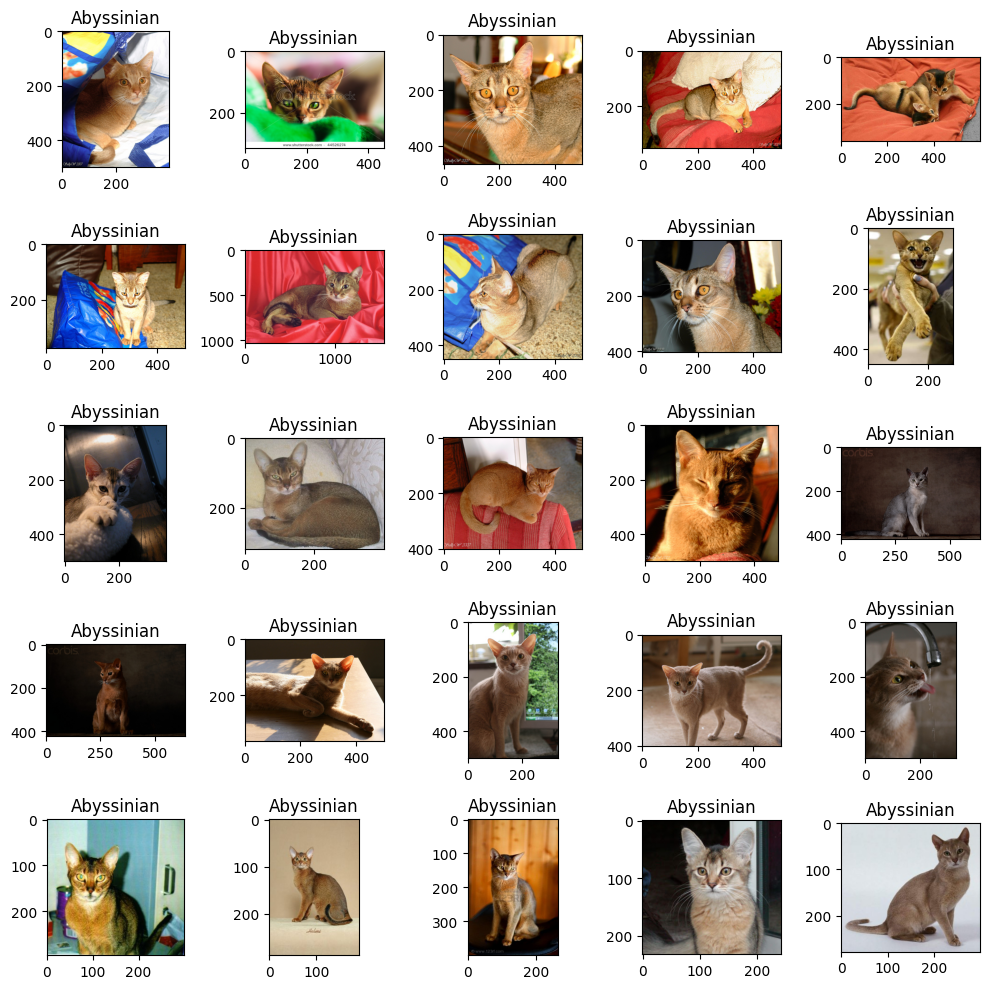

In [ ]:
grid_plot(dataset, rows=5, cols=5, size=(10, 10))

In [ ]:
dataset.class_to_idx

{'Abyssinian': 0,
 'American Bulldog': 1,
 'American Pit Bull Terrier': 2,
 'Basset Hound': 3,
 'Beagle': 4,
 'Bengal': 5,
 'Birman': 6,
 'Bombay': 7,
 'Boxer': 8,
 'British Shorthair': 9,
 'Chihuahua': 10,
 'Egyptian Mau': 11,
 'English Cocker Spaniel': 12,
 'English Setter': 13,
 'German Shorthaired': 14,
 'Great Pyrenees': 15,
 'Havanese': 16,
 'Japanese Chin': 17,
 'Keeshond': 18,
 'Leonberger': 19,
 'Maine Coon': 20,
 'Miniature Pinscher': 21,
 'Newfoundland': 22,
 'Persian': 23,
 'Pomeranian': 24,
 'Pug': 25,
 'Ragdoll': 26,
 'Russian Blue': 27,
 'Saint Bernard': 28,
 'Samoyed': 29,
 'Scottish Terrier': 30,
 'Shiba Inu': 31,
 'Siamese': 32,
 'Sphynx': 33,
 'Staffordshire Bull Terrier': 34,
 'Wheaten Terrier': 35,
 'Yorkshire Terrier': 36}

Instantiate our Image-2-Text pipeline using a Vision Transformer with a GPT2-based text head to generate captions:

In [ ]:
image_to_text = pipeline("image-to-text", model="nlpconnect/vit-gpt2-image-captioning")

Fetching 1 files: 100%|████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10106.76it/s]
Device set to use cuda:0


And run it over all our available samples to generate their captions.
N.B.: Only the trainval split will be used for this as it already contains over 3000 samples which are enough for the scope of this project. (Image Generation will take much longer with 7000+ samples).

In [ ]:
dataset_list = list(dataset)

In [ ]:
BATCH_SIZE = 32

image_captions = {}

for i in tqdm(range(0, len(dataset_list), BATCH_SIZE)):
    samples = dataset_list[i:i+BATCH_SIZE]
    images = [sample[0] for sample in samples]
    captions = image_to_text(images)

    labels = [sample[1] for sample in samples]

    for index, label in enumerate(labels):
        if dataset.classes[label] not in image_captions:
            image_captions[dataset.classes[label]] = []

        image_captions[dataset.classes[label]].append(captions[index][0]["generated_text"])

print(f"Generated {len(image_captions)} captions")

  0%|                                                                                           | 0/115 [00:00<?, ?it/s]The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.
100%|█████████████████████████████████████████████████████████████████████████████████| 115/115 [13:51<00:00,  7.23s/it]

Generated 37 captions


Captions are generated. Now we can free up our resources as we no longer need the image_to_text pipeline:

In [ ]:
del dataset_list
del image_to_text
torch.cuda.empty_cache()

And save them to our Google Drive so we can resume the data again when needed:

In [ ]:
json.dump(image_captions, open(f"{DATA_PATH}/orig_image_captions.json", "w"))

print(len(image_captions))
print(image_captions["Abyssinian"][:10])

37
['a cat is sitting on a blanket in a room ', 'a cat with a green and white stripe on its head ', 'a cat with a blue collar and a yellow head ', 'a cat laying on a red blanket on a red couch ', 'a cat laying on a red blanket on a red blanket ', 'a cat sitting on a blanket next to a bag ', 'a cat laying on a red blanket on a red couch ', 'a cat is standing on a blanket on the floor ', 'a cat with a blue collar and a yellow face ', 'a dog is sitting on a leash with a person ']


The captions look quite ok. Straight to the point. We can now move on to the generation of some variants.

# Generating caption variants

For this task we'll be using one of the smaller models available from the Qwen3 family.

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen3-1.7B")
model = AutoModelForCausalLM.from_pretrained(
    "Qwen/Qwen3-1.7B",
    dtype="auto",
    device_map="cuda"
)

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torch/cuda/__init__.py:816: UserWarning: Can't initialize amdsmi - Error code: 34
  warnings.warn(f"Can't initialize amdsmi - Error code: {e.err_code}")
Loading checkpoint shards: 100%|██████████████████████████████████████████████████████████| 2/2 [00:14<00:00,  7.13s/it]


In [ ]:
import time

# Source: https://huggingface.co/Qwen/Qwen3-1.7B
def generate_caption_variation(model, tokenizer, original_caption, temperature = 0.9, think_longer = False, measure_time = False):
    prompt = f"""
    Produce a short caption variation of the input caption.
    The new caption shall follow these rules:
    1. Subjects must remain identical.
    2. Apply only realistic changes: pose, action, color, object positions, viewpoints.
    3. One sentence only!
    4. No summaries of what has changed!
    5. Keep it short, concise and descriptive.
    6. Output only the new caption, without additional text.
    7. Be creative.

    Caption: {original_caption}
    Variation:
    """
    if measure_time:
        start_time = time.time()

    messages = [
        {"role": "user", "content": prompt}
    ]
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
        enable_thinking=think_longer
    )
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    generated_ids = model.generate(**model_inputs, temperature = temperature, max_new_tokens=1024*64)
    output_ids = generated_ids[0][len(model_inputs.input_ids[0]):].tolist()

    # parsing thinking content
    try:
        # rindex finding 151668 (</think>)
        index = len(output_ids) - output_ids[::-1].index(151668)
    except ValueError:
        index = 0

    content = tokenizer.decode(output_ids[index:], skip_special_tokens=True).strip("\n")

    if measure_time:
        end_time = time.time()
        elapsed_time = end_time - start_time
        return f"{elapsed_time:.4f}s - {content}"

    return content


Let's briefly check how the model performs with different configurations. This will help us in figuring out if we shall go for a higher/lower temperature, or have it use reasoning techniques. Reasoning would make sure that the response we get will actually be different than the original input, but at the cost of higher computation.

In [ ]:
test_caption = "a cat is sitting on a blanket in a room"

print("Thinking-mode disabled:")
print("Temp 0.2: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.2, measure_time=True))
print("Temp 0.4: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.4, measure_time=True))
print("Temp 0.6: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.6, measure_time=True))
print("Temp 0.8: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.8, measure_time=True))
print("Temp 0.9: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.9, measure_time=True))
print("Temp 0.95: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.95, measure_time=True))

print("Thinking-mode enabled:")
print("Temp 0.2: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.2, think_longer = True, measure_time=True))
print("Temp 0.4: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.4, think_longer = True, measure_time=True))
print("Temp 0.6: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.6, think_longer = True, measure_time=True))
print("Temp 0.8: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.8, think_longer = True, measure_time=True))
print("Temp 0.9: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.9, think_longer = True, measure_time=True))
print("Temp 0.95: ", generate_caption_variation(model, tokenizer, test_caption, temperature = 0.95, think_longer = True, measure_time=True))

Thinking-mode disabled:
Temp 0.2:  0.5784s - A cat is sitting on a blanket in a room.
Temp 0.4:  0.5678s - A cat is sitting on a blanket in a room.
Temp 0.6:  0.6251s - A cat is sitting on a fluffy blanket in a room.
Temp 0.8:  0.8051s - A cat is lounging on a cozy blanket in a dimly lit room.
Temp 0.9:  0.6930s - A cat is curled up on a cozy blanket in the room.
Temp 0.95:  0.6538s - A cat is sitting on a beige blanket in a dim room.
Thinking-mode enabled:
Temp 0.2:  57.9220s - a cat is sitting on a blue blanket on a couch in a room
Temp 0.4:  80.6915s - Cat resting on a mat in the room.
Temp 0.6:  40.3770s - A tan cat propping up a light beige blanket on a sunlit windowsill.
Temp 0.8:  97.6959s - a cat is sitting on a cushion in a room
Temp 0.9:  94.2456s - A cat is sitting on a light blue blanket in a dimly lit room.
Temp 0.95:  106.2282s - a cat is sitting on a mat in a room


Overall, looking at the measured execution times, it makes more sense to go without thinking mode as the quality of the generated captions is very similar without having to spend 1min per caption. <br>
A quick and dirty workaround is to simply re-prompt the model whenever it generates a response identical to the input. This way we can iterate quickly without spending too much time and resources.

We'll go with temperature = 0.95 since there's no particular difference given that the model needs to operate within strict guidelines. Anything above 0.8 already looks good, but a higher temperature indicates more entropy for the model so we can potentially get a larger variety of samples.

We'll now generate the new image caption variations which we'll store with a cat/dog label only. If the model generates anything that does not contain either of the 2 labels, we'll save it under the "other" label for later inspection.

In [ ]:
TEMPERATURE = 0.95
extended_image_captions = {"cat": [], "dog": [], "other": []}

image_captions = json.load(open(f"{DATA_PATH}/orig_image_captions.json", "r"))

for label, orig_captions in image_captions.items():
    for i, orig_caption in enumerate(tqdm(orig_captions, desc=f"{label}: ")):
        is_caption_different = False
        temperature_to_use = TEMPERATURE

        while not is_caption_different:
            caption = generate_caption_variation(model, tokenizer, orig_captions[0], temperature = temperature_to_use).lower().strip()

            # Skip duplicates
            if caption == orig_caption or \
              caption in extended_image_captions["cat"] or \
              caption in extended_image_captions["dog"] or \
              caption in extended_image_captions["other"] or \
              caption in orig_captions:
                temperature_to_use += 0.05 # Increase the temperature, hoping that we get different outputs

                if temperature_to_use > 2.0:
                    break # Just skip this one

                # Otherwise retry
                continue

            is_caption_different = True

            if "cat" in caption:
                extended_image_captions["cat"].append(caption)
            elif "dog" in caption:
                extended_image_captions["dog"].append(caption)
            else:
                extended_image_captions["other"].append(caption)

Yorkshire Terrier: 100%|██████████████████████████████████████████████████████████████| 100/100 [02:58<00:00,  1.79s/it]


In [ ]:
json.dump(extended_image_captions, open(f"{DATA_PATH}/new_image_captions.json", "w"))

print("Cat", len(extended_image_captions["cat"]), extended_image_captions["cat"][:10])
print("Dog", len(extended_image_captions["dog"]), extended_image_captions["dog"][:10])
print("Other", len(extended_image_captions["other"]), extended_image_captions["other"][:10])

Cat 1261 ['a cat is perched on a faded blanket in a sunlit room.', 'a cat is lounging on a soft rug beside a window.', 'a cat is perched on a faded blanket in a dimly lit room.', 'a cat is resting on a soft mat in a dimly lit space.', 'a cat is sitting on a beige blanket in a sunlit room.', 'a cat is sitting on a white blanket in a sunlit room.', 'a cat perched on a faded blanket in a dimly lit room.', 'a cat is lounging on a plush rug by a window.', 'a cat perched on a faded blanket in a quiet room.', 'a cat lounges on a soft blanket in a sunlit room.']
Dog 1910 ['a dog is standing in a field with a bunch of flowers.', 'a dog is standing in a field with a bouquet of flowers.', 'a dog is standing in a field with a few flowers.', 'a dog is standing in a field with a burst of flowers.', 'a dog is standing in a field with a cluster of flowers.', 'a dog stands in a field with a bouquet of flowers.', 'a dog is standing in a field with a few blooming flowers.', 'a dog is standing in a field 

Free up resources occupied by Qwen3:

In [ ]:
del tokenizer
del model
torch.cuda.empty_cache()

# Post-processing of generated caption variants
As we can see above, Qwen3 generated variants containing neither "cat" nor "dog", so they ended up in the "other" category. This shows that the model we chose doesn't follow instructions very well. On the other hand, however, due to the limited resources we have available, we can clean this up manually. Otherwise we'd need to either enable reasoning (which is very slow), or use a more powerful model (which will require more resources).

Reload the generated captions first:

In [ ]:
generated_image_captions = json.load(open(f"{DATA_PATH}/new_image_captions.json", "r"))

print("Cat", len(generated_image_captions["cat"]))
print("Dog", len(generated_image_captions["dog"]))
print("Other", len(generated_image_captions["other"]))

Cat 1261
Dog 1910
Other 509


Inspect how these captions start so we get an idea of what kind of animals were used:

In [ ]:
captions_start_with = list(set([" ".join(caption.split()[:5]) for caption in generated_image_captions["other"]]))
captions_start_with

['a golden retriever leaping over',
 'a gray wolf prowling across',
 'a golden retriever stares directly',
 'a golden retriever is perched',
 'a sleek greyhound stretches on',
 'a tan fox lounges on',
 'a golden retriever pauses mid-stride,',
 'a golden retriever poised atop',
 'a golden retriever leaps over',
 'a golden retriever posing confidently',
 'a golden retriever poses proudly',
 'a golden retriever reclining on',
 'a silver tabby lounging on',
 'a golden retriever strides across',
 'a golden retriever stands on',
 'a golden retriever poses by',
 'a golden retriever lounges on',
 'a golden retriever leaning against',
 'a gray fox crouching on',
 'a golden retriever is sprawled',
 'a golden retriever stretches on',
 'a golden retriever poised in',
 'a brown fox perched on',
 'a gray tabby stretching on',
 'a golden retriever strides along',
 'a golden retriever resting on',
 'a grayhound with a red',
 'a golden retriever with a',
 'a golden retriever sprawled on',
 'a golden re

Considering that the Qwen3 model preferred Dogs more than Cats, we'll use these captions exclusively for the Cats category to help increase the number of possible samples and reduce class unbalancing.

In [ ]:
def caption_replace(caption : str, pattern : list, replace_with : list):
    for p, r in zip(pattern, replace_with):
        if p in caption:
            caption = caption.replace(p, r)
    return caption

other_image_captions = [
    caption_replace(
        caption,
        ["retriever", "grayhound", "greyhound", "fox", "wolf", "tabby", "feline", "canine", "white polar bear"],
        ["cat", "cat", "cat", "cat", "cat", "cat", "cat", "cat", "cat"]
    )
    for caption in generated_image_captions["other"]
]
other_image_captions[:5]

['a golden cat poses proudly in a field of blooming tulips.',
 'a golden cat lounges in a meadow surrounded by vibrant wildflowers.',
 'a golden cat stretches in a sunlit meadow with vibrant wildflowers.',
 'a golden cat stands in a field surrounded by blooming roses.',
 'a golden cat leaps over a fence in a meadow with sunlit flowers.']

Lastly, filter out eventual duplicates from all lists and save the new set:

In [ ]:
cleaned_new_image_captions = {
    "cat": list(set(generated_image_captions["cat"] + other_image_captions)),
    "dog": list(set(generated_image_captions["dog"]))
}

json.dump(cleaned_new_image_captions, open(f"{DATA_PATH}/new_cleaned_image_captions.json", "w"))

total_captions = len(cleaned_new_image_captions["cat"]) + len(cleaned_new_image_captions["dog"])
print("Cat %d %.2f%%" % (len(cleaned_new_image_captions["cat"]), len(cleaned_new_image_captions["cat"]) / total_captions * 100.0))
print("Dog %d %.2f%%" % (len(cleaned_new_image_captions["dog"]), len(cleaned_new_image_captions["dog"]) / total_captions * 100.0))
print("Total captions:", total_captions)

Cat 1767 48.06%
Dog 1910 51.94%
Total captions: 3677


There's some very small class imbalance here favoring dogs over cats. As a quick fix, we can manipulate some captions from the Dogs and transform them into Cat, or simply truncate the lists. Truncating will make us lose possibly useful samples for our training, so we'll go with caption manipulation for now.

In [ ]:
total_diff_caption_count = len(cleaned_new_image_captions["dog"]) - len(cleaned_new_image_captions["cat"])
total_captions_to_manipulate = total_diff_caption_count // 2
print(f"Difference dog vs cat: {total_diff_caption_count}")
print(f"Total captions to manipulate: {total_captions_to_manipulate}")

Difference dog vs cat: 143
Total captions to manipulate: 71


We'll select the last 71 samples from the dog list:

In [ ]:
dog_captions_to_manipulate = cleaned_new_image_captions["dog"][ -total_captions_to_manipulate : ]
print(f"Selected captions count: {len(dog_captions_to_manipulate)}")
dog_captions_to_manipulate[:5]

Selected captions count: 71


['a dog curling in the snow with paws tucked against its body.',
 'a dog is standing on the floor in front of a door, gazing at the entrance with curious eyes.',
 'a tan dog resting on a beige mat.',
 'a dog leaning on a couch with a collar.',
 'a dog is standing in a field with a bunch of flowers, slightly tilted head and vibrant green foliage around it']

In [ ]:
new_cat_captions = [caption_replace(caption, ["dog"], ["cat"]) for caption in dog_captions_to_manipulate]
new_cat_captions[:5]

['a cat curling in the snow with paws tucked against its body.',
 'a cat is standing on the floor in front of a door, gazing at the entrance with curious eyes.',
 'a tan cat resting on a beige mat.',
 'a cat leaning on a couch with a collar.',
 'a cat is standing in a field with a bunch of flowers, slightly tilted head and vibrant green foliage around it']

Merge all lists and create final balanced set of captions:

In [ ]:
balanced_new_image_captions = {
    "cat": list(set(generated_image_captions["cat"] + other_image_captions + new_cat_captions)),
    "dog": list(set(generated_image_captions["dog"][ : -total_captions_to_manipulate ]))
}

json.dump(balanced_new_image_captions, open(f"{DATA_PATH}/new_balanced_image_captions.json", "w"))

total_captions = len(balanced_new_image_captions["cat"]) + len(balanced_new_image_captions["dog"])
print("Cat %d %.2f%%" % (len(balanced_new_image_captions["cat"]), len(balanced_new_image_captions["cat"]) / total_captions * 100.0))
print("Dog %d %.2f%%" % (len(balanced_new_image_captions["dog"]), len(balanced_new_image_captions["dog"]) / total_captions * 100.0))
print("Total captions:", total_captions)

Cat 1838 49.99%
Dog 1839 50.01%
Total captions: 3677


Looking much better now! Next up: Image generation from captions!

# Image Generation from generated captions
Diffusion models are generally very resource intensive, so we need to pick a lightweight model that still manages to generate realistic images. <br>
A good one seemed to be Stable Diffusion v1.5 which uses only 3-5GB of VRAM and still offers good quality images.

In [ ]:
from diffusers import StableDiffusionPipeline

# https://huggingface.co/sd-legacy/stable-diffusion-v1-5
model_id = "sd-legacy/stable-diffusion-v1-5"

image_pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
image_pipe.to("cuda")
image_pipe.enable_attention_slicing()

In [ ]:
def caption_to_image(pipe, caption, save_path, show = False, num_inference_steps=40, guidance_scale=4.5, max_sequence_length=512):
    torch.cuda.empty_cache()

    images = pipe(
        prompt=caption,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        max_sequence_length=max_sequence_length,
    )

    if show:
        return images.images

    for image in images.images:
        image.save(save_path)

    del images

100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:28<00:00,  1.39it/s]


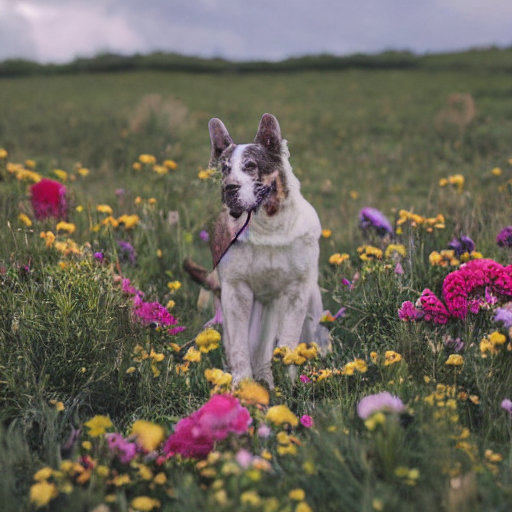

In [ ]:
prompt = "a dog standing in a field with a bunch of flowers"
images = caption_to_image(image_pipe, prompt, "test.png", show = True)
images[0]

The generated image looks okay-ish. There are occasionally some artefacts like in the picture above, but it still seems like a good compromise between quality, usability and performance-cost. <br>
If we wanted higher quality images, we'd either need to increase the inference steps (taking more time to generate the images), or switch to a larger model (which will use up more resources).

Let's reload all the generated captions from disk:

In [ ]:
balanced_new_image_captions = json.load(open(f"{DATA_PATH}/new_balanced_image_captions.json", "r"))

total_captions = len(balanced_new_image_captions["cat"]) + len(balanced_new_image_captions["dog"])
print("Cat %d %.2f%%" % (len(balanced_new_image_captions["cat"]), len(balanced_new_image_captions["cat"]) / total_captions * 100.0))
print("Dog %d %.2f%%" % (len(balanced_new_image_captions["dog"]), len(balanced_new_image_captions["dog"]) / total_captions * 100.0))
print("Total captions:", total_captions)

Cat 1838 49.99%
Dog 1839 50.01%
Total captions: 3677


Create a small helper method:

In [ ]:
def generate_images(pipe, captions, label):
    os.makedirs(f"{DATA_PATH}/images/{label}", exist_ok=True)

    print(f"Generating {label}...")

    for i, caption in enumerate(captions):
        try:
            caption_to_image(image_pipe, caption, f"{DATA_PATH}/images/{label}/{i}.png")
        except Exception as ex:
            print(f"An error was thrown while processing this caption of category {label} at index {i}: ", caption, ex)

And launch the image generation process. Due to hardware restrictions, I'm running the image generation step separately for each label so that, in case Google Colab aborts the session, I can resume from where I left off a bit easier (if needed).

In [ ]:
generate_images(image_pipe, balanced_new_image_captions["cat"], "cat")

Generating cat...


100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.04it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.33it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.11it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.05it/s]
Potential NSFW content was detected in one or more images. A black image will 

In [ ]:
generate_images(image_pipe, balanced_new_image_captions["dog"], "dog")

Generating dog...


100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.00it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.13it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
100%|███████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.15it/s]


In [ ]:
del image_pipe
torch.cuda.empty_cache()

# Generated dataset exploration
Let's check what the image generation model managed to generate.

In [ ]:
gen_images_dataset = ImageFolder(f"{DATA_PATH}/images", transform=ToTensor())
gen_images_dataset

Dataset ImageFolder
    Number of datapoints: 3677
    Root location: ./content/drive/MyDrive/GenAIDataAugmentation/images
    StandardTransform
Transform: ToTensor()

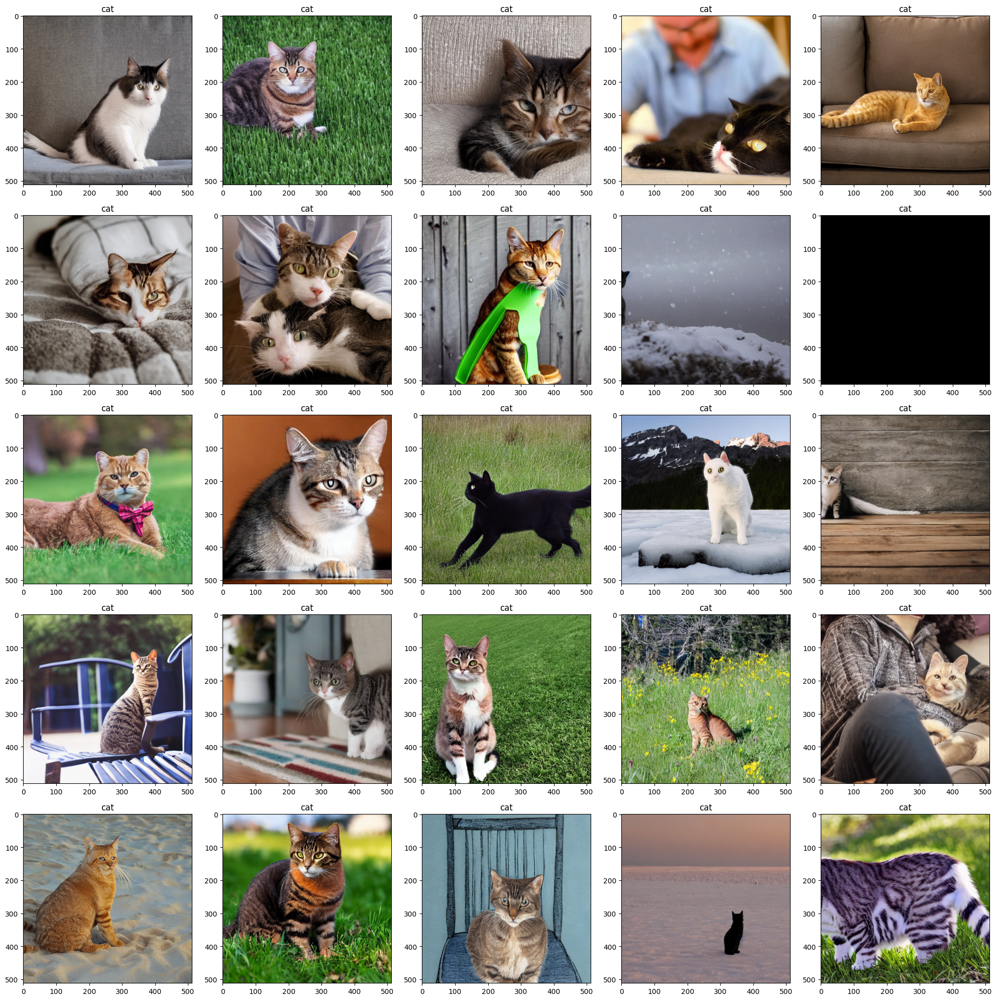

In [ ]:
grid_plot(gen_images_dataset, rows=5, cols=5, size=(20, 20), use_normalization = False)

These are only the first 25 images and we can already assess the overall quality of what was generated:
- Quality: Despite having used a small SD 1.5 model, the pixel-quality is quite good
- Realism: While there are several artifacts, the overall entity is still well recognizable

There are also several blacked images due to "NSFW" content which were censored.. We'll just delete those images.

One thing I noticed while manually going through the generated images is that the image model generated dog images with the cat class:

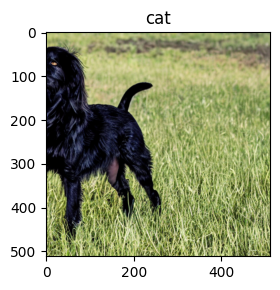

In [ ]:
grid_plot(
    gen_images_dataset,
    gen_images_dataset.imgs.index(("./content/drive/MyDrive/GenAIDataAugmentation/images/cat/198.png", 0)),
    rows=1, cols=1, size=(3, 3),
    use_normalization = False
)

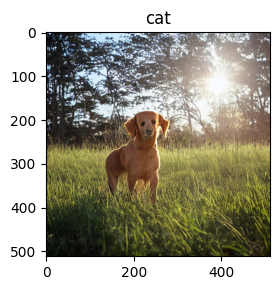

In [ ]:
grid_plot(
    gen_images_dataset,
    gen_images_dataset.imgs.index(("./content/drive/MyDrive/GenAIDataAugmentation/images/cat/237.png", 0)),
    rows=1, cols=1, size=(3, 3),
    use_normalization = False
)

This will obviously introduce issues during training and inference. Therefore, we need to clean-up the dataset beforehand.

# Augmented Dataset preparation
Now that we've generated new images, we need to prepare the complete dataset. First, we'll need to clean up the generated images. Then, we can copy all original images + the generated ones into a new set of labelled folders. We'll end up running a 2-class classification task (cat vs dog) so all the different races will be grouped together.

## Cleaning up images
Finding the blacked images is fairly straightforward. We can iterate through the ImageFolder dataset and check if the image tensors are all 0.0 -> all black.

In [ ]:
# Find all blacked images
for idx, image in enumerate(gen_images_dataset):
    if torch.all(image[0] == 0.0):
        print(idx, gen_images_dataset.imgs[idx])
        os.remove(gen_images_dataset.imgs[idx][0])

While to find the dogs within the cat class, we can first check if we messed up the captions:

In [ ]:
for label, captions in balanced_new_image_captions.items():
    print(f"-------- {label} ---------")
    for idx, caption in enumerate(captions):
        if f" {label} " not in caption and f" {label}'" not in caption:
            print(idx, caption)

Looks like the post-processing step for the generated captions did not go so well.. We've cleaned up only the captions which ended up in the "other" category, without checking the actual "cat" and "dog" categories.

To quickly assess this, let's check the `generated_image_captions`:

In [ ]:
dog_captions_in_cat_class = [caption for caption in generated_image_captions["cat"] if "dog" in caption]
cat_captions_in_dog_class = [caption for caption in generated_image_captions["dog"] if "cat" in caption]
print(f"Dog captions in cat class: {len(dog_captions_in_cat_class)}")
print(f"Cat captions in dog class: {len(cat_captions_in_dog_class)}")

For simplicity we can just delete those wrong images as we already have plenty.

In [ ]:
for label, captions in balanced_new_image_captions.items():
    for idx, caption in enumerate(captions):
        if f" {label} " not in caption and f" {label}'" not in caption:
            os.remove(f"{DATA_PATH}/images/{label}/{idx}.png")

## Prepare full dataset folders
Now that the images are cleaned up, we can copy everything into clean and separate folders.

First, we need to map the old classes to the new ones (cat or dog):

In [ ]:
dataset.class_to_idx

{'Abyssinian': 0,
 'American Bulldog': 1,
 'American Pit Bull Terrier': 2,
 'Basset Hound': 3,
 'Beagle': 4,
 'Bengal': 5,
 'Birman': 6,
 'Bombay': 7,
 'Boxer': 8,
 'British Shorthair': 9,
 'Chihuahua': 10,
 'Egyptian Mau': 11,
 'English Cocker Spaniel': 12,
 'English Setter': 13,
 'German Shorthaired': 14,
 'Great Pyrenees': 15,
 'Havanese': 16,
 'Japanese Chin': 17,
 'Keeshond': 18,
 'Leonberger': 19,
 'Maine Coon': 20,
 'Miniature Pinscher': 21,
 'Newfoundland': 22,
 'Persian': 23,
 'Pomeranian': 24,
 'Pug': 25,
 'Ragdoll': 26,
 'Russian Blue': 27,
 'Saint Bernard': 28,
 'Samoyed': 29,
 'Scottish Terrier': 30,
 'Shiba Inu': 31,
 'Siamese': 32,
 'Sphynx': 33,
 'Staffordshire Bull Terrier': 34,
 'Wheaten Terrier': 35,
 'Yorkshire Terrier': 36}

In [ ]:
mapped_class_to_idx = {
 'Abyssinian': "cat",
 'American Bulldog': "dog",
 'American Pit Bull Terrier': "dog",
 'Basset Hound': "dog",
 'Beagle': "dog",
 'Bengal': "cat",
 'Birman': "cat",
 'Bombay': "cat",
 'Boxer': "dog",
 'British Shorthair': "cat",
 'Chihuahua': "dog",
 'Egyptian Mau': "cat",
 'English Cocker Spaniel': "dog",
 'English Setter': "dog",
 'German Shorthaired': "dog",
 'Great Pyrenees': "dog",
 'Havanese': "dog",
 'Japanese Chin': "dog",
 'Keeshond': "dog",
 'Leonberger': "dog",
 'Maine Coon': "cat",
 'Miniature Pinscher': "dog",
 'Newfoundland': "dog",
 'Persian': "cat",
 'Pomeranian': "dog",
 'Pug': "dog",
 'Ragdoll': "cat",
 'Russian Blue': "cat",
 'Saint Bernard': "dog",
 'Samoyed': "dog",
 'Scottish Terrier': "dog",
 'Shiba Inu': "dog",
 'Siamese': "cat",
 'Sphynx': "cat",
 'Staffordshire Bull Terrier': "dog",
 'Wheaten Terrier': "dog",
 'Yorkshire Terrier': "dog"
}

Now we can iterate through the original trainval dataset, and copy each image into the correct labelled folder:

In [ ]:
AUGMENTED_DATASET_PATH = f"{DATA_PATH}/augmented_dataset"

In [ ]:
for i, image in enumerate(tqdm(dataset)):
    label = mapped_class_to_idx[dataset.classes[image[1]]]
    os.makedirs(os.path.join(AUGMENTED_DATASET_PATH, "train", label), exist_ok=True)
    image[0].save(os.path.join(AUGMENTED_DATASET_PATH, "train", label, f"{dataset.classes[image[1]]}_{i}.png"))

100%|███████████████████████████████████████████████████████████████████████████████| 3680/3680 [03:08<00:00, 19.56it/s]


As well as the test dataset:

In [ ]:
for i, image in enumerate(tqdm(test_dataset)):
    label = mapped_class_to_idx[test_dataset.classes[image[1]]]
    os.makedirs(os.path.join(AUGMENTED_DATASET_PATH, "test", label), exist_ok=True)
    image[0].save(os.path.join(AUGMENTED_DATASET_PATH, "test", label, f"{test_dataset.classes[image[1]]}_{i}.png"))

100%|███████████████████████████████████████████████████████████████████████████████| 3669/3669 [03:15<00:00, 18.77it/s]


Next, the generated ones:

In [ ]:
print("Generated trainval images path: ", f"{DATA_PATH}/images")

Generated trainval images path:  ./content/drive/MyDrive/GenAIDataAugmentation/images


In [ ]:
!cp -R ./content/drive/MyDrive/GenAIDataAugmentation/images/* ./content/drive/MyDrive/GenAIDataAugmentation/augmented_dataset/train

Check the amount of samples we've got for each class in our training data:

In [ ]:
cat_files = os.listdir(f"{AUGMENTED_DATASET_PATH}/train/cat")
dog_files = os.listdir(f"{AUGMENTED_DATASET_PATH}/train/dog")
print("Cat samples: ", len(cat_files))
print("Dog samples: ", len(dog_files))

Cat samples:  2948
Dog samples:  4329


There's a huge class imbalance due to the fact that the original dataset is already imbalanced (2948 cats vs 4329 dogs). <br>

We have 2 options here:
1. Truncate the amount of dog samples to match the cat ones
2. Train on the imbalanced dataset

Since we've put training and validation samples all into the "train" folder, we still need to create our validation split. Therefore, a simple workaround to not throw away data is to truncate the training samples to the same amount for both classes and take the truncated data and use it for validation in addition to the validation split factor:
- 4329 dogs - 2948 cats = 1381 dogs more
- 20% of cat samples = 589
- Total validation samples: 589 for cats, 1970 for dogs

In [ ]:
VAL_SPLIT_FACTOR = 0.2
VAL_SPLIT_ADD = len(dog_files) - len(cat_files)

for label, files in [("cat", cat_files), ("dog", dog_files)]:
    if label == "dog":
        val_split_size = int((len(files) - VAL_SPLIT_ADD) * VAL_SPLIT_FACTOR) + VAL_SPLIT_ADD
    else:
        val_split_size = int(len(files) * VAL_SPLIT_FACTOR)

    val_files = files[:val_split_size]
    train_files = files[val_split_size : ]

    print("%s: Total(%d) Train(%d) Val(%d)" % (label, len(files), len(train_files), len(val_files)))

    for split, files in [("val", val_files), ("train", train_files)]:
        for file in files:
            os.makedirs(os.path.join(AUGMENTED_DATASET_PATH, split, label), exist_ok=True)
            os.rename(os.path.join(AUGMENTED_DATASET_PATH, "train", label, file), os.path.join(AUGMENTED_DATASET_PATH, split, label, file))

cat: Total(2948) Train(2359) Val(589)
dog: Total(4329) Train(2359) Val(1970)


# Image Augmentations
To further enhance the training, we can apply several transformations to our dataset which will make the model more robust to different angles/variations.

In [ ]:
BATCH_SIZE = 32
MAX_IMAGE_SIZE = 512

Applying transforms to this particular dataset will be tricky since all original images come in different sizes and aspect ratios. Resizing them directly into a suitable size could make the images lose its important features that the model will have to learn.

In [ ]:
# Useful reference: https://github.com/albumentations-team/albumentations/issues/718

class AlbumMediator:
    def __init__(self, operations) -> None:
        self.operations = operations

    def __call__(self, img):
        return self.operations(image=np.array(img))["image"]

basic_transforms = A.Compose([
    A.LongestMaxSize(max_size=MAX_IMAGE_SIZE, interpolation=1), # Resize by considering longest side (keeps aspect-ratio)
    A.PadIfNeeded(min_height=MAX_IMAGE_SIZE, min_width=MAX_IMAGE_SIZE, border_mode=0, fill=0.0),
    A.Resize(224, 224),
    A.Normalize(mean=image_mean, std=image_std),
    ToTensorV2()
])

train_transforms = A.Compose([
    A.LongestMaxSize(max_size=MAX_IMAGE_SIZE, interpolation=1), # Resize by considering longest side (keeps aspect-ratio)
    A.PadIfNeeded(min_height=MAX_IMAGE_SIZE, min_width=MAX_IMAGE_SIZE, border_mode=0, fill=0.0),
    A.Sharpen(alpha=(0.2, 0.4), lightness=(0.5, 1.0), p=0.5),
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.4),
    A.RandomRotate90(p=0.3),
    A.CoarseDropout(
      num_holes_range=(4, 16),
      hole_height_range=(16, 32),
      hole_width_range=(16, 32),
      fill=0.0,
      p=1.0
    ),
    A.Normalize(mean=image_mean, std=image_std),
    ToTensorV2()
])

AUGMENTED_DATASET_PATH = f"{DATA_PATH}/augmented_dataset"
extended_train_set = ImageFolder(os.path.join(AUGMENTED_DATASET_PATH, "train"), transform=ToTensor())
extended_test_set = ImageFolder(os.path.join(AUGMENTED_DATASET_PATH, "test"), transform=ToTensor())
extended_val_set = ImageFolder(os.path.join(AUGMENTED_DATASET_PATH, "val"), transform=ToTensor())

extended_train_set.transform = AlbumMediator(train_transforms)
extended_test_set.transform = AlbumMediator(basic_transforms)
extended_val_set.transform = AlbumMediator(basic_transforms)

In [ ]:
print(f"Train set: {len(extended_train_set)} Classes: {extended_train_set.classes}")
print(f"Test set: {len(extended_test_set)} Classes: {extended_test_set.classes}")
print(f"Val set: {len(extended_val_set)} Classes: {extended_val_set.classes}")

Train set: 4718 Classes: ['cat', 'dog']
Test set: 3669 Classes: ['cat', 'dog']
Val set: 2559 Classes: ['cat', 'dog']


Quick look to see what the transformations do and if they retain useful features/informations:

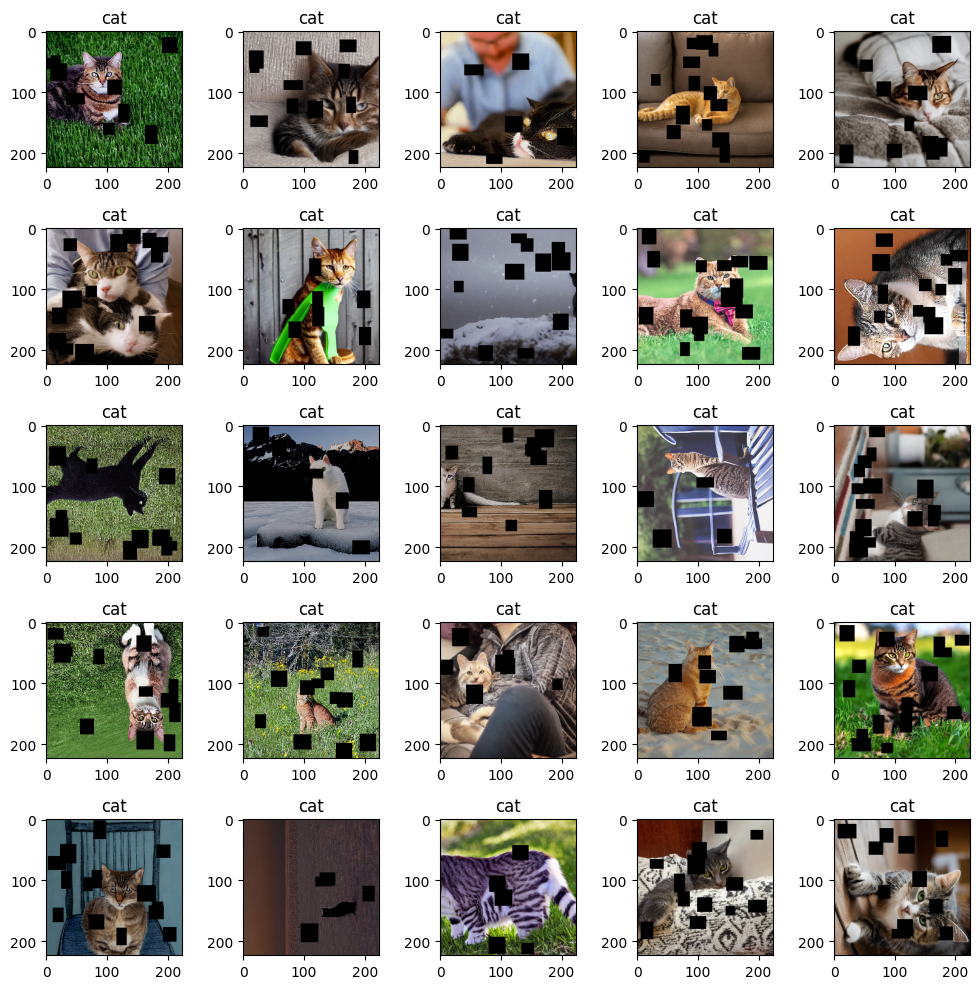

In [ ]:
grid_plot(extended_train_set, rows=5, cols=5, size=(10, 10))

# Model preparation and training
For this classification task, we'll be using a Vision Transformer pre-trained on ImageNet. <br>
Having a transformer-based model pretrained allows us to fine-tune it on our dataset fairly easily. On the other hand, if we were to train a Transformer model from scratch, we'd need to carefully warmup the model with proper LR scheduling, making it quite difficult to get things done quickly. Furthermore, transformers like being trained on a lot of data, but our dataset consists of 3000-4000 training samples only which is definitely not that much.

The pretrained model will serve as our baseline. Then, we'll fine-tune it on top of our original Oxford Pets dataset to assess its performance compared to the baseline. Finally, fine-tune it again on the extended dataset (Oxford + Generated images) to see if the generated images improved the performance of the model.

Define the dataset loaders for the original Oxford Pet dataset:

In [ ]:
class OxfordPetDataset(Dataset):
    """
    Dataset class for the Oxford Pet dataset with optional transforms.
    """
    def __init__(self, base_dataset, transform=None):
        self.base = base_dataset
        self.classes = base_dataset.classes
        self.transform = transform

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, target = self.base[idx]

        mapped_class = mapped_class_to_idx[dataset.classes[target]]
        target = dataset.bin_class_to_idx[mapped_class.capitalize()]

        if isinstance(img, Image.Image):
            img = np.array(img)

        if self.transform:
            augmented = self.transform(image=img)
            img = augmented["image"]
        return img, torch.as_tensor(int(target), dtype=torch.long)

raw_trainset = OxfordPetDataset(dataset, train_transforms)
raw_testset = OxfordPetDataset(test_dataset, basic_transforms)

raw_train_split, raw_val_split = torch.utils.data.random_split(raw_trainset, [0.8, 0.2])

raw_train_loader = DataLoader(raw_train_split, batch_size=BATCH_SIZE, shuffle=True)
raw_val_loader = DataLoader(raw_val_split, batch_size=BATCH_SIZE, shuffle=False)
raw_test_loader = DataLoader(raw_testset, batch_size=BATCH_SIZE, shuffle=False)

print("Train Split size: ", len(raw_train_split))
print("Val Split size: ", len(raw_val_split))
print("Test Split size: ", len(raw_testset))

Train Split size:  2944
Val Split size:  736
Test Split size:  3669


And the dataloaders for our extended dataset:

In [ ]:
extended_train_loader = DataLoader(extended_train_set, batch_size=BATCH_SIZE, shuffle=True)
extended_test_loader = DataLoader(extended_test_set, batch_size=BATCH_SIZE, shuffle=False)
extended_val_loader = DataLoader(extended_val_set, batch_size=BATCH_SIZE, shuffle=False)

## Training helpers
Here we group together some utility methods that we need for training.

In [ ]:
def validate_model(model, criterion, val_loader, device):
    model.eval()
    total_loss = 0.0
    total_samples = 0

    preds_list = []
    labels_list = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            batch_size = images.size(0)
            total_loss += loss.item() * batch_size
            total_samples += batch_size

            batch_preds = outputs.argmax(dim=1).long()
            preds_list.append(batch_preds.detach().cpu())
            labels_list.append(labels.detach().cpu())

    if total_samples == 0:
        raise ValueError("Validation loader is empty or batch size is 0.")

    y_pred = torch.cat(preds_list).numpy()
    y_true = torch.cat(labels_list).numpy()

    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="binary", zero_division=0)
    precision = precision_score(y_true, y_pred, average="binary", zero_division=0)
    recall = recall_score(y_true, y_pred, average="binary", zero_division=0)
    conf_mat = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))

    val_loss = total_loss / total_samples

    return val_loss, acc, f1, precision, recall, conf_mat

def train_model(
    model,
    train_loader,
    val_loader,
    checkpoint_name,
    num_epochs: int = 50,
    lr_rate: float = 0.001,
    weight_decay = 0.0004,
    early_stop_patience: int = 10,
    early_stop_delta: float = 0.001,
    device = None
):
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr_rate, weight_decay=weight_decay)
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=max(1, num_epochs), eta_min=lr_rate / 100.0
    )

    # metrics containers (epoch-level)
    train_metrics = defaultdict(list)
    val_metrics = defaultdict(list)

    early_stop_counter = 0
    best_val_loss = float("inf")

    for epoch in range(num_epochs):
        model.train()
        epoch_loss_sum = 0.0
        epoch_sample_count = 0

        preds_list = []
        labels_list = []

        pbar = tqdm(train_loader, desc=f"Train Epoch {epoch+1}/{num_epochs}", leave=False)
        for images, labels in pbar:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            batch_size = images.size(0)
            epoch_loss_sum += loss.item() * batch_size
            epoch_sample_count += batch_size

            batch_preds = outputs.argmax(dim=1).long()
            preds_list.append(batch_preds.detach().cpu())
            labels_list.append(labels.detach().cpu())

            # update progress bar with running loss (optional)
            pbar.set_postfix({"batch_loss": loss.item()})

        # end of epoch training accumulations
        if epoch_sample_count == 0:
            raise ValueError("Training loader produced zero samples. Check batch size / loader.")

        train_loss = epoch_loss_sum / epoch_sample_count
        y_pred = torch.cat(preds_list).numpy()
        y_true = torch.cat(labels_list).numpy()

        train_acc = accuracy_score(y_true, y_pred)
        train_f1 = f1_score(y_true, y_pred, average="binary", zero_division=0)
        train_precision = precision_score(y_true, y_pred, average="binary", zero_division=0)
        train_recall = recall_score(y_true, y_pred, average="binary", zero_division=0)
        train_conf_mat = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))

        val_loss, val_acc, val_f1, val_precision, val_recall, val_conf_mat = validate_model(
            model, criterion, val_loader, device=device
        )

        lr_scheduler.step()

        # early stopping + checkpointing
        if val_loss + early_stop_delta < best_val_loss:
            model_save_path = os.path.join(DATA_PATH, "checkpoints", checkpoint_name, f"best_model_{epoch}.pt")
            print(f"Val loss improved from {best_val_loss:.6f} -> {val_loss:.6f}. Saving checkpoint to {model_save_path}")
            best_val_loss = val_loss
            early_stop_counter = 0
            os.makedirs(os.path.join(DATA_PATH, "checkpoints", checkpoint_name), exist_ok=True)
            torch.save(model.state_dict(), model_save_path)
        else:
            early_stop_counter += 1
            print(f"Early Stop {early_stop_counter} / {early_stop_patience}")

        if early_stop_counter >= early_stop_patience:
            print("Early stopping triggered")
            break

        # log & store per-epoch metrics
        print(
            f"Epoch {epoch+1}/{num_epochs} | "
            f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
            f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}"
        )

        train_metrics["train_loss"].append(train_loss)
        train_metrics["train_accuracy"].append(train_acc)
        train_metrics["train_f1"].append(train_f1)
        train_metrics["train_precision"].append(train_precision)
        train_metrics["train_recall"].append(train_recall)
        train_metrics["train_conf_matrix"].append(train_conf_mat)

        val_metrics["val_loss"].append(val_loss)
        val_metrics["val_accuracy"].append(val_acc)
        val_metrics["val_f1"].append(val_f1)
        val_metrics["val_precision"].append(val_precision)
        val_metrics["val_recall"].append(val_recall)
        val_metrics["val_conf_matrix"].append(val_conf_mat)

    return train_metrics, val_metrics

In [ ]:
def make_model(num_classes, device):
    """Instantiates the ViT B16 pretrained model with modified classification head"""
    model = models.vit_b_16(pretrained=True)

    # Freeze all parameters
    for param in model.parameters():
        param.requires_grad = False

    # Replace classification head with new one
    model.heads = nn.Sequential(
        nn.Linear(in_features=768, out_features=num_classes)
    )

    return model.to(device)

In [ ]:
def plot_confusion_matrix(matrix, classes):
    sns.heatmap(matrix, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

## Baseline evaluation
Instantiate and evaluate the baseline model on our test set:

In [ ]:
baseline_model = make_model(2, device)

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
baseline_loss, baseline_accuracy, baseline_f1, baseline_precision, baseline_recall, baseline_conf_matrix = validate_model(
    baseline_model,
    nn.CrossEntropyLoss(),
    raw_test_loader,
    device
)

In [ ]:
baseline_loss, baseline_accuracy, baseline_f1, baseline_precision, baseline_recall, baseline_conf_matrix

print(f"Baseline loss: {baseline_loss:.4f}")
print(f"Baseline accuracy: {baseline_accuracy:.4f}")
print(f"Baseline f1: {baseline_f1:.4f}")
print(f"Baseline precision: {baseline_precision:.4f}")
print(f"Baseline recall: {baseline_recall:.4f}")

Baseline loss: 0.7702
Baseline accuracy: 0.4500
Baseline f1: 0.5000
Baseline precision: 0.6510
Baseline recall: 0.4059


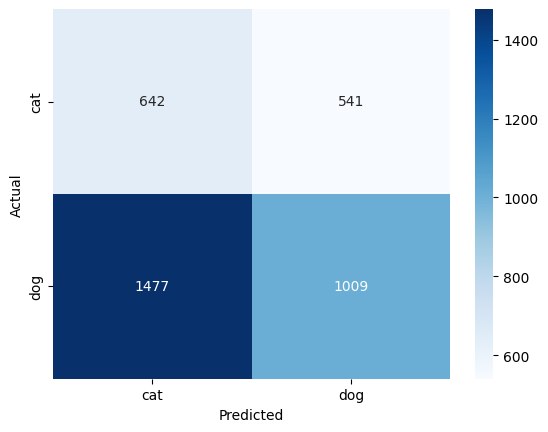

In [ ]:
plot_confusion_matrix(baseline_conf_matrix, ["cat", "dog"])

The numbers above are quite random considering that we've replaced the classification head from the pretrained model with a new untrained linear layer with 2 classes as output.

## Model fine-tuning on original Oxford Pet Dataset
We'll now fine-tune the baseline model on the original Oxford Dataset and then assess the performance.

In [ ]:
oxford_train_metrics, oxford_val_metrics = train_model(
    baseline_model,
    raw_train_loader,
    raw_val_loader,
    "finetuned_oxford_model",
    num_epochs=100,
    lr_rate=3e-4,
    weight_decay=0.0004,
    device=device
)

Val loss improved from inf -> 0.126266. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_0.pt
Epoch 1/100 | Train Loss: 0.1603, Train Acc: 0.9613 | Val Loss: 0.1263, Val Acc: 0.9688


Val loss improved from 0.126266 -> 0.114235. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_1.pt
Epoch 2/100 | Train Loss: 0.1117, Train Acc: 0.9667 | Val Loss: 0.1142, Val Acc: 0.9552


Val loss improved from 0.114235 -> 0.081808. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_2.pt
Epoch 3/100 | Train Loss: 0.0878, Train Acc: 0.9752 | Val Loss: 0.0818, Val Acc: 0.9715


Early Stop 1 / 10
Epoch 4/100 | Train Loss: 0.0860, Train Acc: 0.9725 | Val Loss: 0.0879, Val Acc: 0.9647


Early Stop 2 / 10
Epoch 5/100 | Train Loss: 0.0741, Train Acc: 0.9742 | Val Loss: 0.0834, Val Acc: 0.9715


Val loss improved from 0.081808 -> 0.073140. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_5.pt
Epoch 6/100 | Train Loss: 0.0720, Train Acc: 0.9769 | Val Loss: 0.0731, Val Acc: 0.9769


Early Stop 1 / 10
Epoch 7/100 | Train Loss: 0.0747, Train Acc: 0.9738 | Val Loss: 0.0794, Val Acc: 0.9701


Val loss improved from 0.073140 -> 0.068198. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_7.pt
Epoch 8/100 | Train Loss: 0.0693, Train Acc: 0.9779 | Val Loss: 0.0682, Val Acc: 0.9728


Early Stop 1 / 10
Epoch 9/100 | Train Loss: 0.0707, Train Acc: 0.9755 | Val Loss: 0.0805, Val Acc: 0.9674


Early Stop 2 / 10
Epoch 10/100 | Train Loss: 0.0680, Train Acc: 0.9749 | Val Loss: 0.0689, Val Acc: 0.9755


Val loss improved from 0.068198 -> 0.057572. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_10.pt
Epoch 11/100 | Train Loss: 0.0681, Train Acc: 0.9752 | Val Loss: 0.0576, Val Acc: 0.9783


Early Stop 1 / 10
Epoch 12/100 | Train Loss: 0.0617, Train Acc: 0.9789 | Val Loss: 0.0706, Val Acc: 0.9742


Val loss improved from 0.057572 -> 0.051699. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_12.pt
Epoch 13/100 | Train Loss: 0.0559, Train Acc: 0.9806 | Val Loss: 0.0517, Val Acc: 0.9864


Early Stop 1 / 10
Epoch 14/100 | Train Loss: 0.0531, Train Acc: 0.9793 | Val Loss: 0.0724, Val Acc: 0.9715


Early Stop 2 / 10
Epoch 15/100 | Train Loss: 0.0589, Train Acc: 0.9793 | Val Loss: 0.0867, Val Acc: 0.9688


Early Stop 3 / 10
Epoch 16/100 | Train Loss: 0.0601, Train Acc: 0.9796 | Val Loss: 0.0722, Val Acc: 0.9742


Early Stop 4 / 10
Epoch 17/100 | Train Loss: 0.0552, Train Acc: 0.9823 | Val Loss: 0.0608, Val Acc: 0.9810


Early Stop 5 / 10
Epoch 18/100 | Train Loss: 0.0506, Train Acc: 0.9810 | Val Loss: 0.0624, Val Acc: 0.9783


Early Stop 6 / 10
Epoch 19/100 | Train Loss: 0.0520, Train Acc: 0.9806 | Val Loss: 0.0627, Val Acc: 0.9715


Early Stop 7 / 10
Epoch 20/100 | Train Loss: 0.0529, Train Acc: 0.9800 | Val Loss: 0.0638, Val Acc: 0.9755


Early Stop 8 / 10
Epoch 21/100 | Train Loss: 0.0549, Train Acc: 0.9800 | Val Loss: 0.0748, Val Acc: 0.9715


Early Stop 9 / 10
Epoch 22/100 | Train Loss: 0.0519, Train Acc: 0.9820 | Val Loss: 0.0668, Val Acc: 0.9715


Early Stop 10 / 10
Early stopping triggered


Fine-tuning ImageNet on our Dataset was fairly quick, reaching a maximum of 98,64% validation accuracy. <br>
Let's examine the training and validation metrics on some plots:

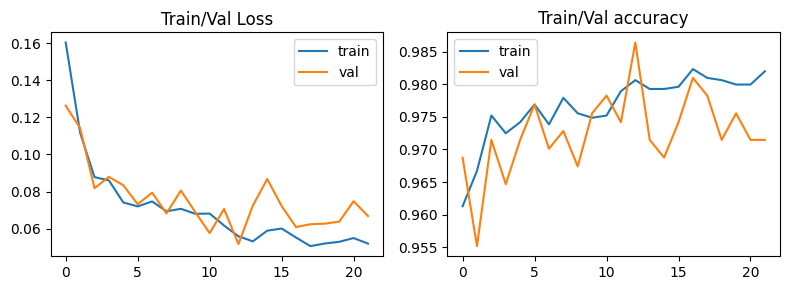

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharex=True)

axes[0].plot(oxford_train_metrics["train_loss"]);
axes[0].plot(oxford_val_metrics["val_loss"])
axes[0].set_title("Train/Val Loss");
axes[0].legend(["train", "val"])

axes[1].plot(oxford_train_metrics["train_accuracy"]);
axes[1].plot(oxford_val_metrics["val_accuracy"])
axes[1].set_title("Train/Val accuracy");
axes[1].legend(["train", "val"])

plt.tight_layout()
plt.show()

Both losses kept decreasing steadily. However, the validation loss is quite noisy, indicating a possibly too high learning rate or imbalanced batches.

Accuracy changed only by ~3% over the entire training which is kind of expected given that we fine-tuned a pretrained model.

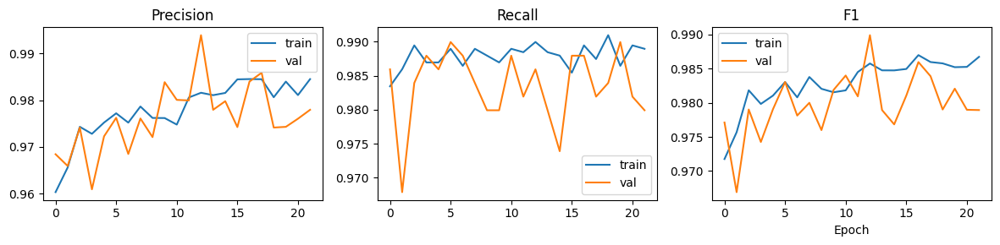

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharex=True)

axes[0].plot(oxford_train_metrics["train_precision"]);
axes[0].plot(oxford_val_metrics["val_precision"])
axes[0].set_title("Precision");
axes[0].legend(["train", "val"])

axes[1].plot(oxford_train_metrics["train_recall"]);
axes[1].plot(oxford_val_metrics["val_recall"])
axes[1].set_title("Recall");
axes[1].legend(["train", "val"])

axes[2].plot(oxford_train_metrics["train_f1"]);
axes[2].plot(oxford_val_metrics["val_f1"])
axes[2].set_title("F1");
axes[2].legend(["train", "val"])
axes[2].set_xlabel("Epoch")

plt.tight_layout()
plt.show()

All 3 metrics show a clear and steady increase in performance until convergence, with occasional spikes due to the reasons mentioned earlier.
The Recall kind of plateud quickly while precision kept increasing over the epochs. However, F1 gives us an overall confirmation of the actual performance the model has reached.

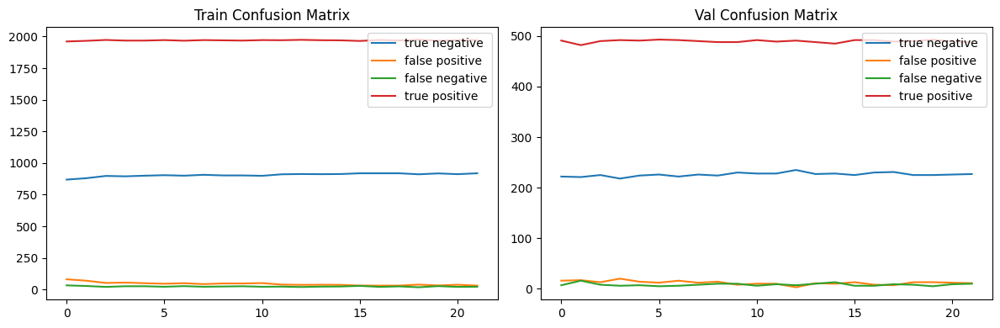

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharex=True)

axes[0].plot(np.array(oxford_train_metrics["train_conf_matrix"]).flatten()[0::4])
axes[0].plot(np.array(oxford_train_metrics["train_conf_matrix"]).flatten()[1::4])
axes[0].plot(np.array(oxford_train_metrics["train_conf_matrix"]).flatten()[2::4])
axes[0].plot(np.array(oxford_train_metrics["train_conf_matrix"]).flatten()[3::4])
axes[0].set_title("Train Confusion Matrix")
axes[0].legend(["true negative", "false positive", "false negative", "true positive"])

axes[1].plot(np.array(oxford_val_metrics["val_conf_matrix"]).flatten()[0::4])
axes[1].plot(np.array(oxford_val_metrics["val_conf_matrix"]).flatten()[1::4])
axes[1].plot(np.array(oxford_val_metrics["val_conf_matrix"]).flatten()[2::4])
axes[1].plot(np.array(oxford_val_metrics["val_conf_matrix"]).flatten()[3::4])
axes[1].set_title("Val Confusion Matrix")
axes[1].legend(["true negative", "false positive", "false negative", "true positive"])

plt.tight_layout()
plt.show()

Above we see how the confusion matrix values have evolved over time. The lines appear fairly straight, so it's difficult to properly see by how much the numbers have improved. The true negatives and true positives do seem to have slightly increased (very little), while the false ones have decreased a bit. <br><br>
Let's analyze the performance on the same test set used for the baseline model:

In [ ]:
BEST_MODEL_OXFORD_PATH = "./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_oxford_model/best_model_12.pt"
baseline_model.load_state_dict(torch.load(BEST_MODEL_OXFORD_PATH))

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torch/cuda/__init__.py:816: UserWarning: Can't initialize amdsmi - Error code: 34
  warnings.warn(f"Can't initialize amdsmi - Error code: {e.err_code}")


<All keys matched successfully>

In [ ]:
oxford_loss, oxford_accuracy, oxford_f1, oxford_precision, oxford_recall, oxford_conf_matrix = validate_model(
    baseline_model,
    nn.CrossEntropyLoss(),
    raw_test_loader,
    device
)

In [ ]:
oxford_loss, oxford_accuracy, oxford_f1, oxford_precision, oxford_recall, oxford_conf_matrix

print(f"Oxford loss: {oxford_loss:.4f}")
print(f"Oxford accuracy: {oxford_accuracy:.4f}")
print(f"Oxford f1: {oxford_f1:.4f}")
print(f"Oxford precision: {oxford_precision:.4f}")
print(f"Oxford recall: {oxford_recall:.4f}")

Oxford loss: 0.0206
Oxford accuracy: 0.9965
Oxford f1: 0.9974
Oxford precision: 0.9952
Oxford recall: 0.9996


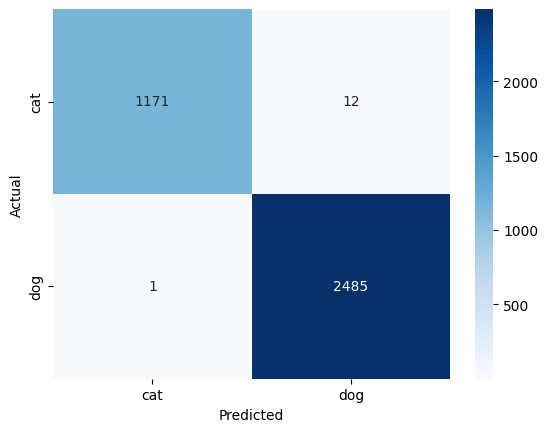

In [ ]:
plot_confusion_matrix(oxford_conf_matrix, ["cat", "dog"])

Beating these numbers with the extended dataset will be almost impossible since we have near perfect performance so far. <br><br>
Let's fine-tune this model regardless to see if and how things change!

## Model fine-tuning on extended Oxford Pet Dataset
We'll now fine-tune the baseline model on the original Oxford Dataset and then assess the performance.

In [ ]:
baseline_model = make_model(2, device)

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
extended_train_metrics, extended_val_metrics = train_model(
    baseline_model,
    extended_train_loader,
    extended_val_loader,
    "finetuned_extended_model",
    num_epochs=20,
    lr_rate=5e-5, # Was 3e-4
    weight_decay=0.005, # Was 0.0004
    early_stop_patience=2,
    device=device
)

Val loss improved from inf -> 0.526725. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_0.pt
Epoch 1/20 | Train Loss: 0.6080, Train Acc: 0.6687 | Val Loss: 0.5267, Val Acc: 0.7444


Val loss improved from 0.526725 -> 0.382194. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_1.pt
Epoch 2/20 | Train Loss: 0.4003, Train Acc: 0.8777 | Val Loss: 0.3822, Val Acc: 0.9121


Val loss improved from 0.382194 -> 0.294933. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_2.pt
Epoch 3/20 | Train Loss: 0.3062, Train Acc: 0.9311 | Val Loss: 0.2949, Val Acc: 0.9644


Val loss improved from 0.294933 -> 0.239329. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_3.pt
Epoch 4/20 | Train Loss: 0.2453, Train Acc: 0.9500 | Val Loss: 0.2393, Val Acc: 0.9773


Val loss improved from 0.239329 -> 0.201969. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_4.pt
Epoch 5/20 | Train Loss: 0.2088, Train Acc: 0.9563 | Val Loss: 0.2020, Val Acc: 0.9824


Val loss improved from 0.201969 -> 0.175891. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_5.pt
Epoch 6/20 | Train Loss: 0.1864, Train Acc: 0.9549 | Val Loss: 0.1759, Val Acc: 0.9867


Val loss improved from 0.175891 -> 0.156608. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_6.pt
Epoch 7/20 | Train Loss: 0.1685, Train Acc: 0.9612 | Val Loss: 0.1566, Val Acc: 0.9887


Val loss improved from 0.156608 -> 0.143576. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_7.pt
Epoch 8/20 | Train Loss: 0.1638, Train Acc: 0.9557 | Val Loss: 0.1436, Val Acc: 0.9891


Val loss improved from 0.143576 -> 0.132975. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_8.pt
Epoch 9/20 | Train Loss: 0.1528, Train Acc: 0.9606 | Val Loss: 0.1330, Val Acc: 0.9902


Val loss improved from 0.132975 -> 0.124373. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_9.pt
Epoch 10/20 | Train Loss: 0.1459, Train Acc: 0.9557 | Val Loss: 0.1244, Val Acc: 0.9906


Val loss improved from 0.124373 -> 0.118286. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_10.pt
Epoch 11/20 | Train Loss: 0.1414, Train Acc: 0.9621 | Val Loss: 0.1183, Val Acc: 0.9910


Val loss improved from 0.118286 -> 0.112827. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_11.pt
Epoch 12/20 | Train Loss: 0.1341, Train Acc: 0.9614 | Val Loss: 0.1128, Val Acc: 0.9910


Val loss improved from 0.112827 -> 0.108983. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_12.pt
Epoch 13/20 | Train Loss: 0.1279, Train Acc: 0.9648 | Val Loss: 0.1090, Val Acc: 0.9910


Val loss improved from 0.108983 -> 0.105956. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_13.pt
Epoch 14/20 | Train Loss: 0.1281, Train Acc: 0.9616 | Val Loss: 0.1060, Val Acc: 0.9914


Val loss improved from 0.105956 -> 0.103838. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_14.pt
Epoch 15/20 | Train Loss: 0.1168, Train Acc: 0.9688 | Val Loss: 0.1038, Val Acc: 0.9910


Val loss improved from 0.103838 -> 0.102333. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_15.pt
Epoch 16/20 | Train Loss: 0.1231, Train Acc: 0.9606 | Val Loss: 0.1023, Val Acc: 0.9910


Val loss improved from 0.102333 -> 0.101295. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_16.pt
Epoch 17/20 | Train Loss: 0.1218, Train Acc: 0.9640 | Val Loss: 0.1013, Val Acc: 0.9910


Early Stop 1 / 2
Epoch 18/20 | Train Loss: 0.1215, Train Acc: 0.9648 | Val Loss: 0.1005, Val Acc: 0.9910


Val loss improved from 0.101295 -> 0.100122. Saving checkpoint to ./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_18.pt
Epoch 19/20 | Train Loss: 0.1199, Train Acc: 0.9665 | Val Loss: 0.1001, Val Acc: 0.9910


Early Stop 1 / 2
Epoch 20/20 | Train Loss: 0.1204, Train Acc: 0.9652 | Val Loss: 0.0999, Val Acc: 0.9910


Compared to the previous training, we got ~2% more on validation here and with the reduced learning rate, the loss/accuracy metrics fluctuated way less.

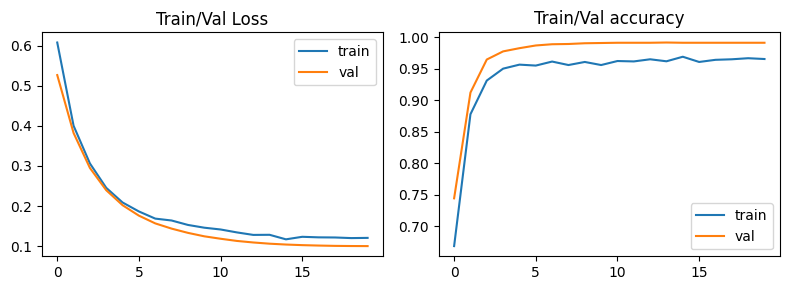

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharex=True)

axes[0].plot(extended_train_metrics["train_loss"]);
axes[0].plot(extended_val_metrics["val_loss"])
axes[0].set_title("Train/Val Loss");
axes[0].legend(["train", "val"])

axes[1].plot(extended_train_metrics["train_accuracy"]);
axes[1].plot(extended_val_metrics["val_accuracy"])
axes[1].set_title("Train/Val accuracy");
axes[1].legend(["train", "val"])

plt.tight_layout()
plt.show()

Seeing the training metrics below the validation ones is unusual, but gives a clear signal that the model is generalizing really well.

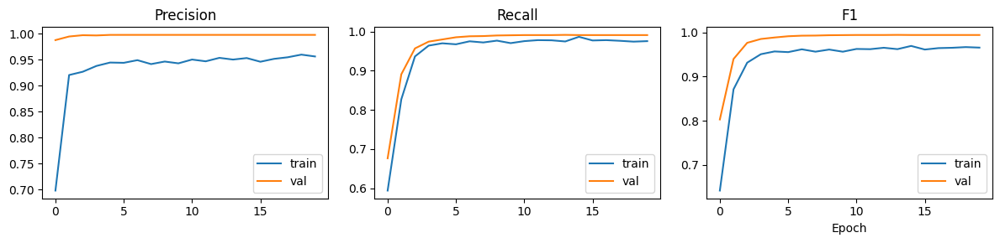

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharex=True)

axes[0].plot(extended_train_metrics["train_precision"]);
axes[0].plot(extended_val_metrics["val_precision"])
axes[0].set_title("Precision");
axes[0].legend(["train", "val"])

axes[1].plot(extended_train_metrics["train_recall"]);
axes[1].plot(extended_val_metrics["val_recall"])
axes[1].set_title("Recall");
axes[1].legend(["train", "val"])

axes[2].plot(extended_train_metrics["train_f1"]);
axes[2].plot(extended_val_metrics["val_f1"])
axes[2].set_title("F1");
axes[2].legend(["train", "val"])
axes[2].set_xlabel("Epoch")

plt.tight_layout()
plt.show()

The model also converged fairly quickly, improving only by a very small margin over time. Overall numbers remained comparable to the ones from the previous training.

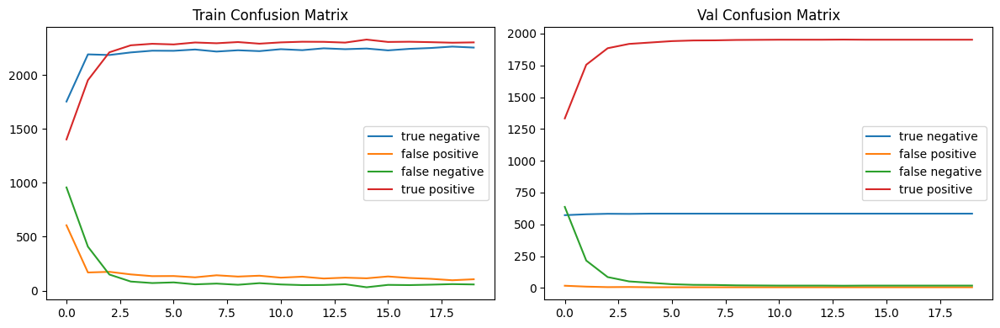

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharex=True)

axes[0].plot(np.array(extended_train_metrics["train_conf_matrix"]).flatten()[0::4])
axes[0].plot(np.array(extended_train_metrics["train_conf_matrix"]).flatten()[1::4])
axes[0].plot(np.array(extended_train_metrics["train_conf_matrix"]).flatten()[2::4])
axes[0].plot(np.array(extended_train_metrics["train_conf_matrix"]).flatten()[3::4])
axes[0].set_title("Train Confusion Matrix")
axes[0].legend(["true negative", "false positive", "false negative", "true positive"])

axes[1].plot(np.array(extended_val_metrics["val_conf_matrix"]).flatten()[0::4])
axes[1].plot(np.array(extended_val_metrics["val_conf_matrix"]).flatten()[1::4])
axes[1].plot(np.array(extended_val_metrics["val_conf_matrix"]).flatten()[2::4])
axes[1].plot(np.array(extended_val_metrics["val_conf_matrix"]).flatten()[3::4])
axes[1].set_title("Val Confusion Matrix")
axes[1].legend(["true negative", "false positive", "false negative", "true positive"])

plt.tight_layout()
plt.show()

Same observation as above: Converged fairly quickly. There are still some misclassified samples which we'll look at in a moment. <br>
Let's check the validation metrics on the test set:

In [ ]:
BEST_MODEL_EXTENDED_PATH = "./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_18.pt"
baseline_model.load_state_dict(torch.load(BEST_MODEL_EXTENDED_PATH))

/home/shini/deeplearning/.venv/lib/python3.10/site-packages/torch/cuda/__init__.py:816: UserWarning: Can't initialize amdsmi - Error code: 34
  warnings.warn(f"Can't initialize amdsmi - Error code: {e.err_code}")


<All keys matched successfully>

In [ ]:
extended_loss, extended_accuracy, extended_f1, extended_precision, extended_recall, extended_conf_matrix = validate_model(
    baseline_model,
    nn.CrossEntropyLoss(),
    raw_test_loader,
    device
)

In [ ]:
print(f"Oxford loss: {extended_loss:.4f}")
print(f"Oxford accuracy: {extended_accuracy:.4f}")
print(f"Oxford f1: {extended_f1:.4f}")
print(f"Oxford precision: {extended_precision:.4f}")
print(f"Oxford recall: {extended_recall:.4f}")

Oxford loss: 0.0988
Oxford accuracy: 0.9954
Oxford f1: 0.9966
Oxford precision: 0.9948
Oxford recall: 0.9984


And the related confusion matrix:

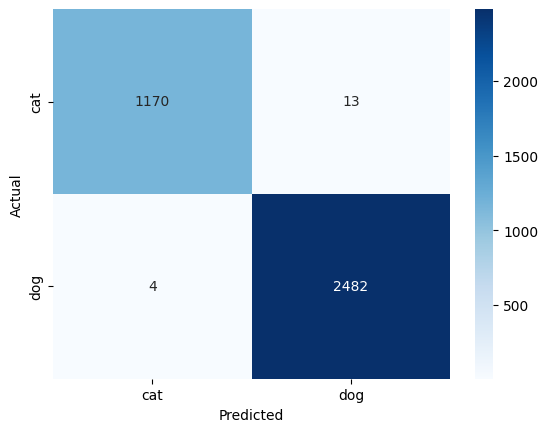

In [ ]:
plot_confusion_matrix(extended_conf_matrix, ["cat", "dog"])

Only 17 misclassified samples! Let's see where the model is struggling.

# Analyze misclassified samples

In [ ]:
BEST_MODEL_EXTENDED_PATH = "./content/drive/MyDrive/GenAIDataAugmentation/checkpoints/finetuned_extended_model/best_model_18.pt"
baseline_model.load_state_dict(torch.load(BEST_MODEL_EXTENDED_PATH))
baseline_model.eval()

preds_list = []
labels_list = []

with torch.no_grad():
    for images, labels in tqdm(raw_test_loader, desc="Validation", leave=False):
        images = images.to(device)
        labels = labels.to(device)
        outputs = baseline_model(images)
        batch_preds = outputs.argmax(dim=1).long()
        preds_list.append(batch_preds.detach().cpu())
        labels_list.append(labels.detach().cpu())

y_pred = torch.cat(preds_list).numpy()
y_true = torch.cat(labels_list).numpy()

In [ ]:
y_pred_mask = y_pred != y_true # Pick only misclassified samples
print("Misclassified sample count: ", np.sum(y_pred_mask))

Misclassified sample count:  17


In [ ]:
misclassified_indices = np.argwhere(y_pred_mask == np.amax(y_pred_mask)).flatten().tolist()
print(misclassified_indices)

[5, 304, 521, 528, 599, 728, 732, 743, 2033, 2099, 2117, 2589, 3006, 3280, 3333, 3344, 3356]


Visualize the misclassified samples. `image_from_tensor` will de-normalize the image tensors prior to converting it back into a PIL Image, so we will only see the image cropping and resizing:

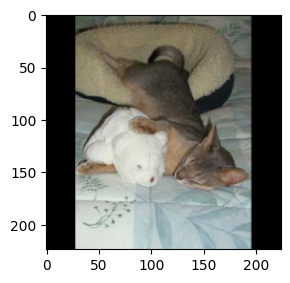

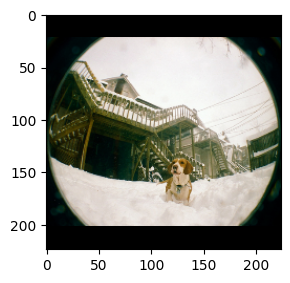

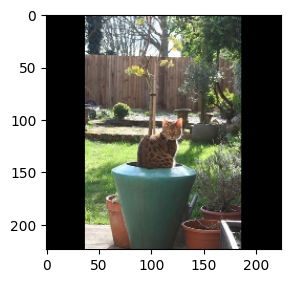

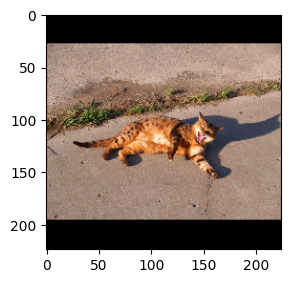

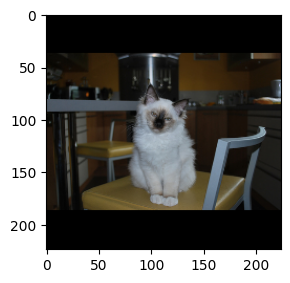

...

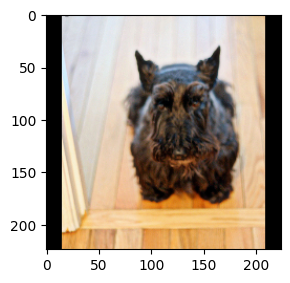

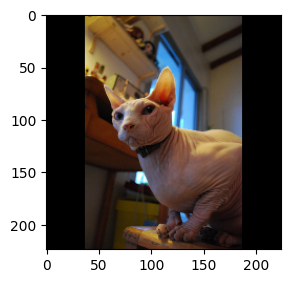

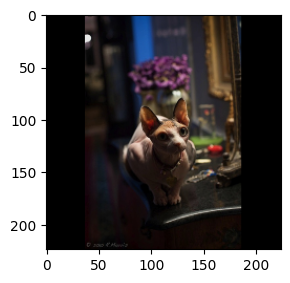

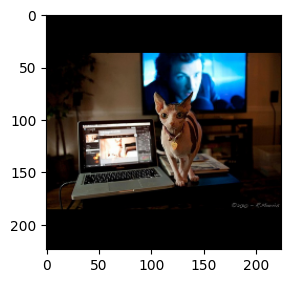

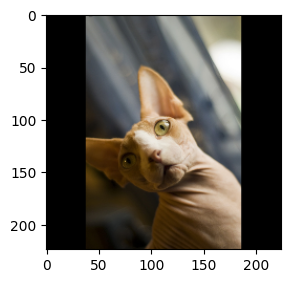

In [ ]:
for idx in misclassified_indices:
    plt.figure(figsize=(3, 3))
    plt.imshow(image_from_tensor(basic_transforms(image=np.array(test_dataset[idx][0]))["image"]))
    plt.tight_layout()
    plt.show()

The images look well interpretable and shouldn't leave any room for misclassification. Given that the training achieved very high performance metrics, it's unlikely that the training transformations disrupted the image features.. <br><br>
The reasons can be many:
- The generated images from our Stable Diffusion 1.5 model may have introduced some generalization issue given that the generated cats and dogs looked.. weird.
- Or the fine-tuned output head of out ViT model is too small (768x2)
- Or the weight decay regularization was too heavy
- Or the model reached its generalization capacity

# Conclusion

### Comparison of training metrics (test+val datasets)
Metric | Original Oxford Dataset | Extended Dataset
-------------------|-------------------|------------------
Train Loss | 0.0519 | 0.1204
Train Accuracy | 0.9820 | 0.9652
Val Loss | 0.0668 | 0.0999
Val Accuracy | 0.9715 | 0.9910

### Comparison of metrics on testset
Metric | Original Oxford Dataset | Extended Dataset
-------------------|-------------------|------------------
Loss | 0.0206 | 0.0988
Accuracy | 0.9965 | 0.9954
F1 | 0.9974 | 0.9966
Precision | 0.9952 | 0.9948
Recall | 0.9996 | 0.9984


Perhaps for educational purposes it would have been better to go for a simple CNN-based architecture and have it trained from scratch. This way it would have been easier to assess the benefits of augmenting a dataset with generated data.
<br><br>
Using a pretrained transformer model led to having near-perfect metrics given that they are a very powerful architecture.
The generated dataset didn't really improve the model performance a lot (only ~2% on the validation set but 0% on the test set).
<br><br>
However, in a real-world scenario where we have little data (such as Powerplants security), generating augmented data will have several benefits and potentially lead to better models for that particular field. Though extra care must be taken when generating artificial data: It has to be as realistic and close to the groundtruth as possible in order to avoid introducing false and unrealistic data into the model. <br><br>
We used Stable Diffusion 1.5 for our cat/dog classification task, but it's a small model that is unable to generate excellent images. In fact, it generated many samples where pets and individuals looked weird (artefacts, incorrect leg-count, squished faces, etc). If we were to train a model to predict whether a cat on a picture with 5 legs was "normal", we could have introduced a lot of unrealistic bias.